# 220968280 - Anirudh Swaminathan - DSE A2

## Week 3 - Exercise 6 - bias correction dataset

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
%matplotlib inline

In [3]:
df = pd.DataFrame()
df = pd.read_csv("C://Users//s_ani//Documents//textbooks//4thSem//ML_LAB//Week3//datasets//Bias_correction_ucl.csv")
df = df.dropna(axis=0)
df = df.drop(['station','Date'], axis=1)
df.head()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [4]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

### 1. Linear regression on bias correction dataset

In [5]:
X = train['Present_Tmax']
Y = train['Next_Tmax']

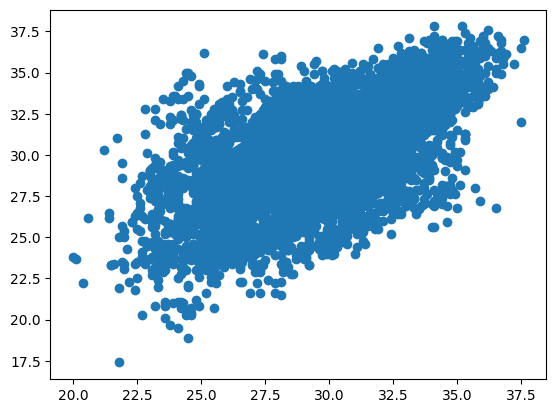

In [6]:
plt.scatter(X, Y)

In [7]:
X = np.array(X).reshape((-1,1))
Y = np.array(Y).reshape((-1,1))
reg = LinearRegression().fit(X, Y)

In [8]:
print(f'{reg.intercept_} + {reg.coef_} * x')

[11.04929659] + [[0.64442685]] * x


In [9]:
x = np.linspace(15, 40, 100)
y = reg.intercept_ + reg.coef_*x
y = y.reshape(100,1)

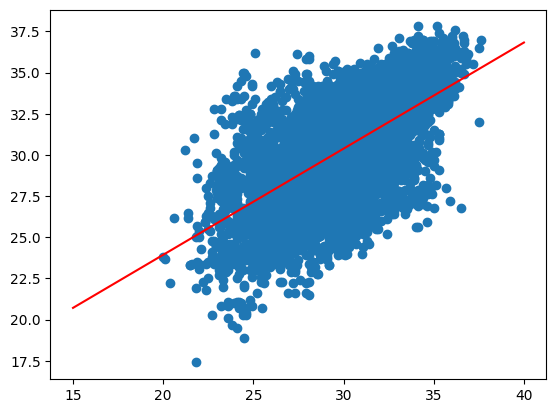

In [10]:
plt.scatter(X, Y)
plt.plot(x, y, c='red')

In [11]:
xi = int(input("Enter an integer: "))
y_pred = reg.predict([[xi]])
print(f'the predicted value is:{y_pred}')

the predicted value is:[[32.31538268]]


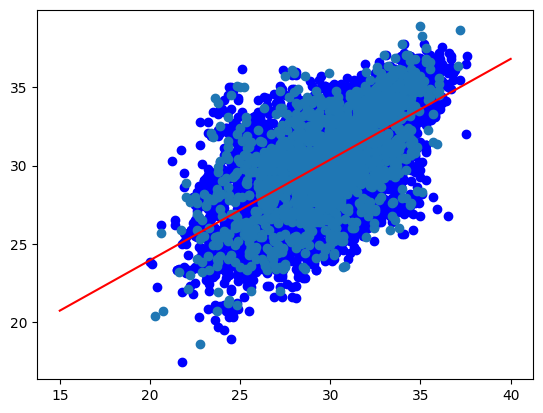

In [12]:
plt.scatter(xi,y_pred,c='red')
plt.plot(x, y, c='red')
plt.scatter(X, Y, c='blue')
plt.scatter(test['Present_Tmax'], test['Next_Tmax'])

In [13]:
predictions = reg.predict(np.array(test['Present_Tmax']).reshape((-1,1)))
mse = mean_squared_error(test['Next_Tmax'], predictions)
print(f'mse = {mse}')

mse = 6.082640398836273


### 2. Multiple linear regression on bias correction dataset

In [14]:
X = train.drop(['Next_Tmax', 'Present_Tmin', 'Next_Tmin'], axis=1)
Y = train['Next_Tmax']
Y = pd.DataFrame(Y)

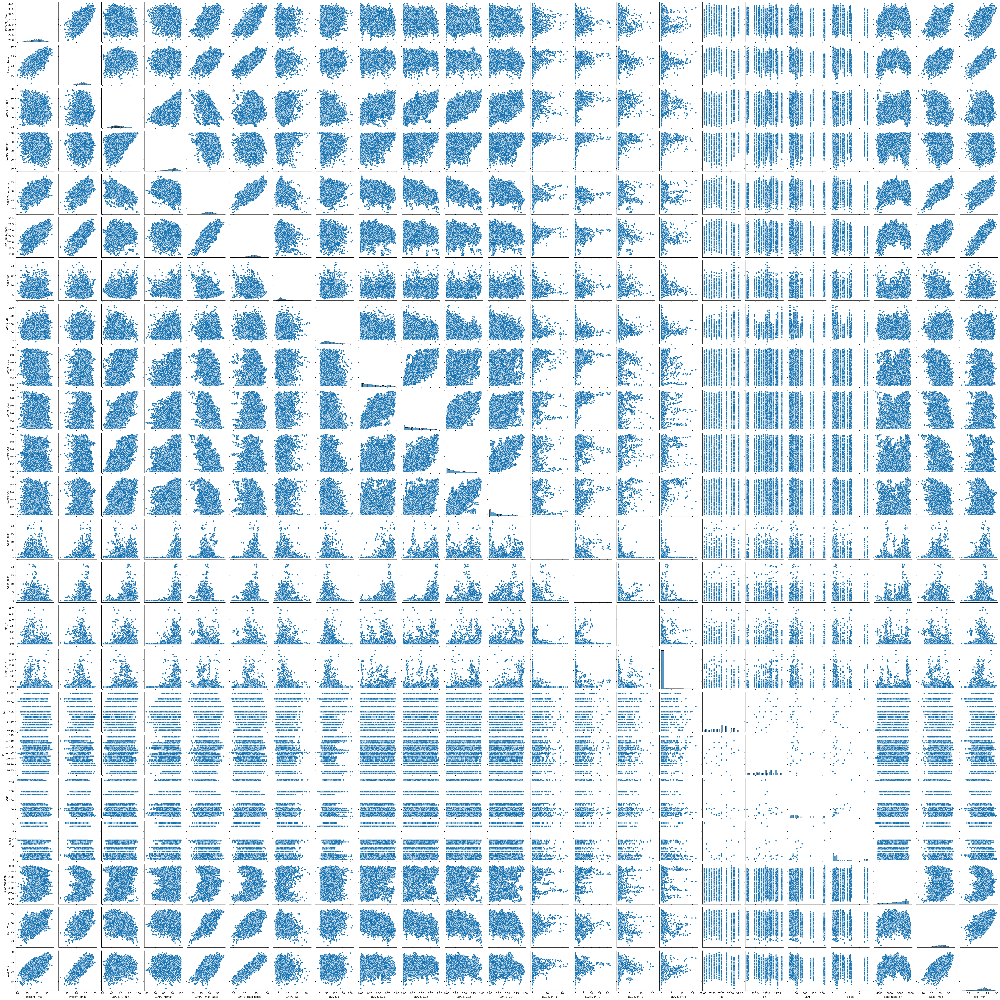

In [15]:
sns.pairplot(train)

In [16]:
reg = LinearRegression().fit(X, Y)

In [17]:
print(f'{reg.intercept_[0]} + {reg.coef_[0][0]}*X1 + {reg.coef_[0][1]}*X2')

291.928806165536 + 0.14524033373073164*X1 + 0.022041819869447574*X2


In [18]:
X

,Present_Tmax,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
6642,30.1,63.743256,91.876495,30.193933,23.168006,5.577053,83.147026,0.141718,0.234209,0.172736,0.090442,0.000000,0.000000,0.000000,0.000000,37.4832,127.024,56.4448,1.2313,5689.926270
7469,27.5,92.451935,99.208504,24.081100,21.254163,10.367878,35.139185,0.843557,0.891118,0.928496,0.799728,0.235204,0.671522,1.706064,0.065057,37.6181,127.004,146.5540,4.7296,4959.315430
6936,28.2,58.318825,78.931541,30.642312,24.141183,7.237083,15.230229,0.387062,0.388934,0.386426,0.133833,0.000000,0.000000,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,5524.085938
2357,34.1,45.836838,77.601021,35.186408,26.809464,10.795521,84.852917,0.468707,0.343275,0.319448,0.619358,0.008876,0.000000,0.000000,0.590660,37.4697,126.910,52.5180,1.5629,5390.396484
350,23.1,72.985626,98.905754,28.231726,22.614715,10.374683,54.318716,0.792033,0.789055,0.336950,0.385886,5.799429,0.874444,0.000000,0.000000,37.6046,126.991,212.3350,2.7850,5868.596680
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5253,29.5,77.810013,99.226311,29.053216,25.451752,3.598260,63.197464,0.612539,0.396768,0.394549,0.249045,2.159575,0.002355,0.002979,0.000000,37.6450,127.022,45.7160,2.5348,5545.169922
5288,32.0,50.294838,83.881470,32.217132,27.032874,8.874336,15.746239,0.218579,0.108899,0.295746,0.068040,0.002907,0.000000,0.000000,0.000000,37.4967,126.927,30.9680,0.6180,5524.800781
5477,30.8,47.390812,92.908234,33.564936,24.197968,5.281015,68.499059,0.418305,0.139525,0.260347,0.228497,0.088776,0.000000,0.415253,0.524872,37.5776,127.058,33.3068,0.2661,5348.927246
868,31.9,59.744675,88.695778,31.665128,25.518303,7.285725,45.637048,0.519194,0.403704,0.102709,0.154826,0.060346,0.000000,0.000000,0.000000,37.5776,126.938,75.0924,1.7678,5382.394043


In [28]:
x1i = float(input('enter x1:'))
x2i = float(input('enter x2:'))
x3i = float(input('enter x3:'))
x4i = float(input('enter x4:'))
x5i = float(input('enter x5:'))
x6i = float(input('enter x6:'))
x7i = float(input('enter x7:'))
x8i = float(input('enter x8:'))
x9i = float(input('enter x9:'))
x10i = float(input('enter x10:'))
x11i = float(input('enter x11:'))
x12i = float(input('enter x12:'))
x13i = float(input('enter x13:'))
x14i = float(input('enter x14:'))
x15i = float(input('enter x15:'))
x16i = float(input('enter x16:'))
x17i = float(input('enter x17:'))
x18i = float(input('enter x18:'))
x19i = float(input('enter x19:'))
x20i = float(input('enter x20:'))
x = np.array([[x1i, x2i, x3i, x4i, x5i, x6i, x7i, x8i, x9i, x10i, x11i, x12i, x13i, x14i, x15i, x16i, x17i, x18i, x19i, x20i]])
y_pred = reg.predict(x)
print(f'predicted value:{y_pred}')

predicted value:[[285.8157906]]


c:\Users\s_ani\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [20]:
test_x = test.drop(['Next_Tmax','Present_Tmin','Next_Tmin'], axis=1)
test_x = pd.DataFrame(test_x)
predictions = reg.predict((test_x))
mse = mean_squared_error(test['Next_Tmax'], predictions)
print(f'mse = {mse}')

mse = 2.1621381635234593
